In [64]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2
from scipy.integrate import solve_ivp

t_eval = np.arange(0, 4.5, 0.5)
nx, ny=64, 64
d1, d2=0.1, 0.1
m = 1
beta = 1
N = nx*ny
x2=np.linspace(-10,10,nx+1)
x=x2[:nx]
y2=np.linspace(-10,10,ny+1)
y=y2[:ny]
X, Y = np.meshgrid(x,y)

kx = (2 * np.pi / 20) * np.concatenate((np.arange(0, nx/2), np.arange(-nx/2, 0)))
ky = (2 * np.pi / 20) * np.concatenate((np.arange(0, ny/2), np.arange(-ny/2, 0)))
KX, KY = np.meshgrid(kx,ky)
K = (KX**2)+(KY**2)

u=np.tanh(np.sqrt(X**2+Y**2))*np.cos(m*np.angle(X+1j*Y)-(np.sqrt(X**2+Y**2)))
v=np.tanh(np.sqrt(X**2+Y**2))*np.sin(m*np.angle(X+1j*Y)-(np.sqrt(X**2+Y**2)))
u0t = fft2(u)
v0t = fft2(v)
uv0tf = np.hstack([u0t.reshape(N), v0t.reshape(N)])

def solver(t, uv0tf, nx, ny, K, N, d1, d2):
    u0t = (uv0tf[:nx**2]).reshape((nx,ny))
    v0t = (uv0tf[nx**2:]).reshape((nx,ny))
    u0 = ifft2(u0t)
    v0 = ifft2(v0t)
    As = u0**2+v0**2
    l = 1-As
    o = -beta*As
    lu = l*u0
    lv = l*v0
    ou = o*u0
    ov = o*v0
    rhs_u = (fft2(lu-ov) - d1*K*u0t).reshape(N)
    rhs_v = (fft2(ou+lv) - d2*K*v0t).reshape(N)
    return np.hstack([rhs_u, rhs_v])


sol = solve_ivp(solver, [0,4], uv0tf, args = (nx, ny, K, N, d1, d2), t_eval=t_eval)

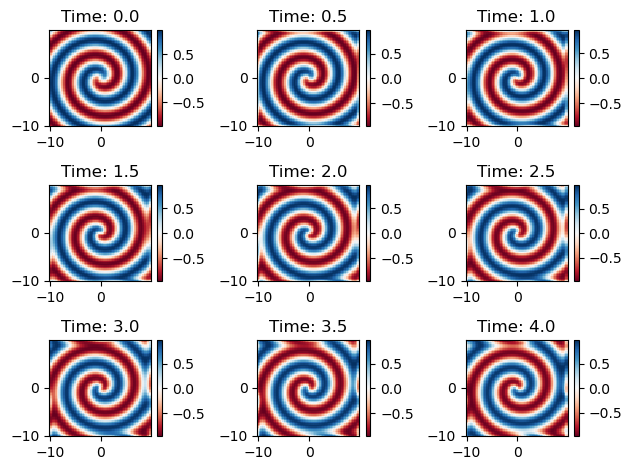

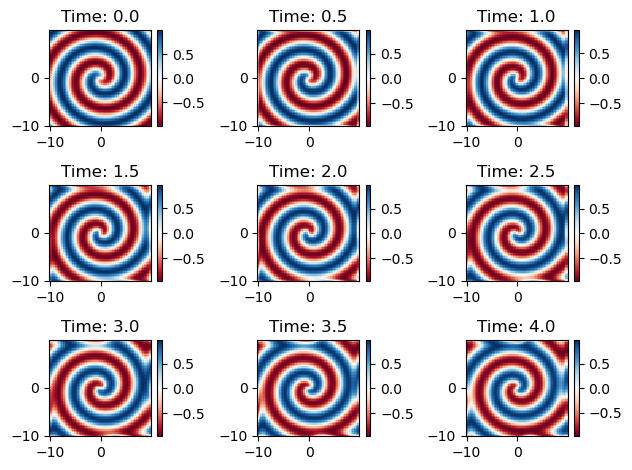

In [50]:
for j, t in enumerate(t_eval):
    fut = (sol.y[:nx**2, j].reshape((nx, ny)))
    u_sol = np.real(ifft2(fut))
    plt.subplot(3, 3, j + 1)
    plt.pcolor(x, y, u_sol, cmap='RdBu')
    plt.title(f'Time: {t}')
    plt.colorbar()
    
plt.tight_layout()
plt.show()

for j, t in enumerate(t_eval):
    fvt = (sol.y[nx**2:, j].reshape((nx, ny)))
    v_sol = np.real(ifft2(fvt))
    plt.subplot(3, 3, j + 1)
    plt.pcolor(x, y, v_sol, cmap='RdBu')
    plt.title(f'Time: {t}')
    plt.colorbar()
    
plt.tight_layout()
plt.show()

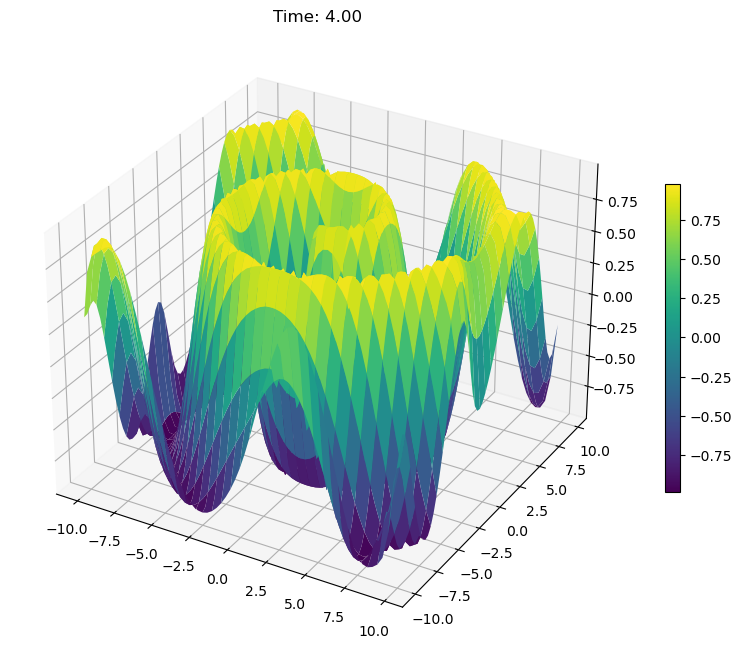

In [33]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.fft import ifft2
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def get_frame(j):
    fut = (sol.y[:nx**2, j].reshape((nx, ny))+1j*sol.y[nx**2:2*nx**2,j].reshape((nx,ny)))
    return np.real(ifft2(fut))

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
u_sol = get_frame(0)
surf = ax.plot_surface(X, Y, u_sol, cmap='viridis', edgecolor='none')
ax.set_title(f'Time: {t_eval[0]:.2f}')
cbar = fig.colorbar(surf, ax=ax, shrink=0.5)
def update(frame):
    u_sol = get_frame(frame)
    ax.clear()  
    surf = ax.plot_surface(X, Y, u_sol, cmap='viridis', edgecolor='none')  
    ax.set_title(f'Time: {t_eval[frame]:.2f}')  
    return [surf]


ani = FuncAnimation(
    fig, update, frames=len(t_eval), interval=300, blit=False
)


HTML(ani.to_jshtml())

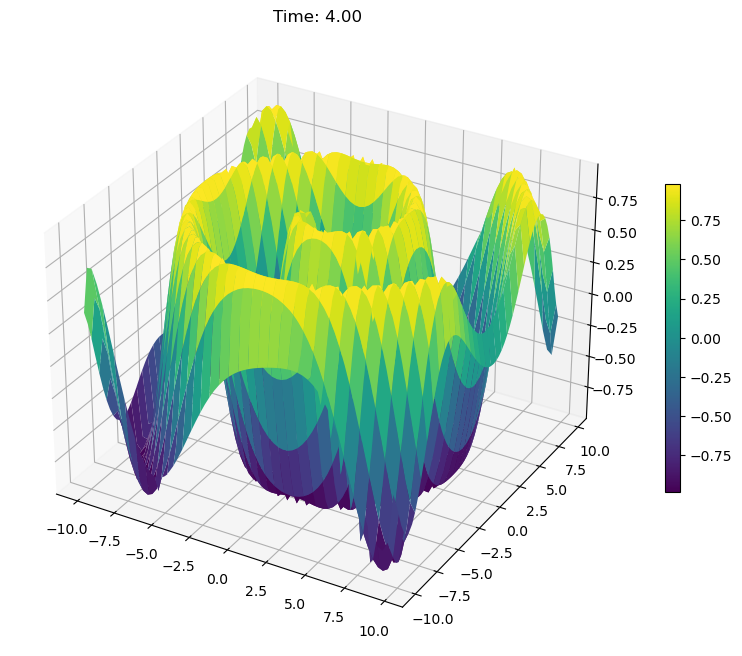

In [4]:
def get_frame(j):
    fvt = (sol.y[2*nx**2:3*nx**2, j].reshape((nx, ny))+1j*sol.y[3*nx**2:4*nx**2,j].reshape((nx,ny)))
    return np.real(ifft2(fvt))

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
v_sol = get_frame(0)
surf = ax.plot_surface(X, Y, v_sol, cmap='viridis', edgecolor='none')
ax.set_title(f'Time: {t_eval[0]:.2f}')
cbar = fig.colorbar(surf, ax=ax, shrink=0.5)
def update(frame):
    v_sol = get_frame(frame)
    ax.clear()  
    surf = ax.plot_surface(X, Y, v_sol, cmap='viridis', edgecolor='none')  
    ax.set_title(f'Time: {t_eval[frame]:.2f}')  
    return [surf]


ani = FuncAnimation(
    fig, update, frames=len(t_eval), interval=300, blit=False
)


HTML(ani.to_jshtml())

In [80]:
from scipy.linalg import kron
def cheb(N):
    if N == 0: 
        D = np.array([[0.]])
        x = np.array([1.])
    else:
        n = np.arange(0, N + 1)
        x = np.cos(np.pi * n / N).reshape(N + 1, 1)
        c = np.hstack(([2.], np.ones(N - 1), [2.])) * (-1)**n
        c = c.reshape(N + 1, 1)
        X = np.tile(x, (1, N + 1))
        dX = X - X.T
        D = (np.dot(c, 1. / c.T)) / (dX + np.eye(N + 1))
        D -= np.diag(np.sum(D.T, axis=0))
    return D, x.reshape(N+1)


N = 30
D, x_ = cheb(N)
D[N,:] = 0
D[0,:] = 0
D2 = (np.dot(D, D))/100
y_ = x_
I = np.eye(len(D2))
L = kron(I, D2) + kron(D2, I)
d1, d2=0.1, 0.1
m = 1
beta = 1
X_, Y_ = np.meshgrid(x_,y_)
X_L, Y_L = X_*10, Y_*10

u=np.tanh(np.sqrt(X_L**2+Y_L**2))*np.cos(m*np.angle(X_L+1j*Y_L)-(np.sqrt(X_L**2+Y_L**2)))
v=np.tanh(np.sqrt(X_L**2+Y_L**2))*np.sin(m*np.angle(X_L+1j*Y_L)-(np.sqrt(X_L**2+Y_L**2)))
uv0 = np.concatenate([u.flatten(),v.flatten()])

def cheb_sol(t, uv0, L, d1, d2):
    u0 = uv0[:(N+1)**2]
    v0 = uv0[(N+1)**2:]
    As = u0**2 + v0**2
    Lambda = 1-As
    omega = -beta*As
    rhs_u = Lambda * u0 - omega * v0 + d1 * np.dot(L, u0)
    rhs_v = omega * u0 + Lambda * v0 + d2 * np.dot(L, v0)
    return np.concatenate([rhs_u.flatten(),rhs_v.flatten()])
    
csol = solve_ivp(cheb_sol, [0,4], uv0, args = (L, d1, d2), t_eval=t_eval)

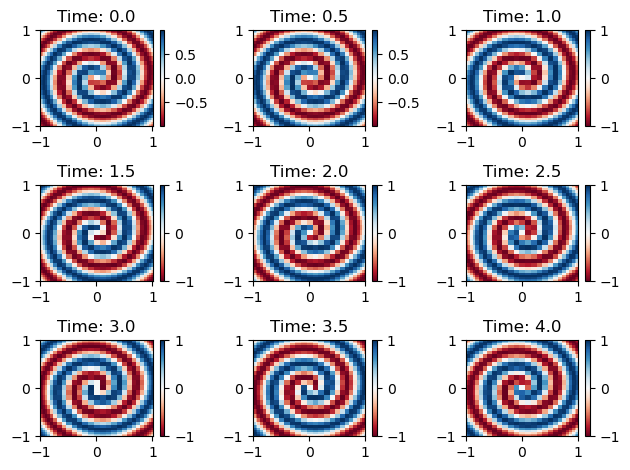

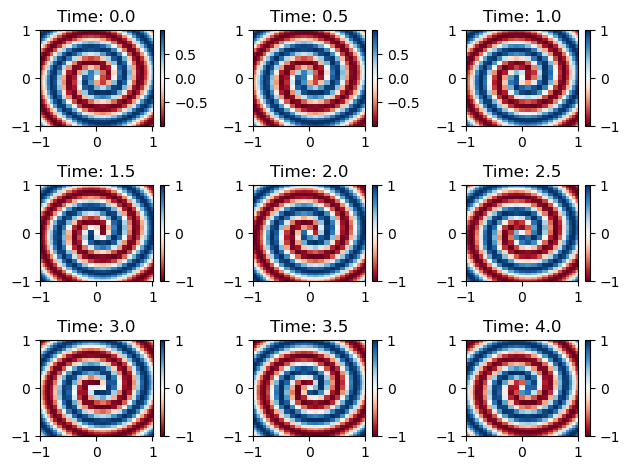

In [68]:
for j, t in enumerate(t_eval):
    fu = csol.y[:(N+1)**2, j].reshape(N+1, N+1)
    plt.subplot(3, 3, j + 1)
    plt.pcolor(x_, y_, fu, cmap='RdBu')
    plt.title(f'Time: {t}')
    plt.colorbar()
    
plt.tight_layout()
plt.show()

for j, t in enumerate(t_eval):
    fv = csol.y[(N+1)**2:, j].reshape(N+1, N+1)
    plt.subplot(3, 3, j + 1)
    plt.pcolor(x_, y_, fv, cmap='RdBu')
    plt.title(f'Time: {t}')
    plt.colorbar()
    
plt.tight_layout()
plt.show()

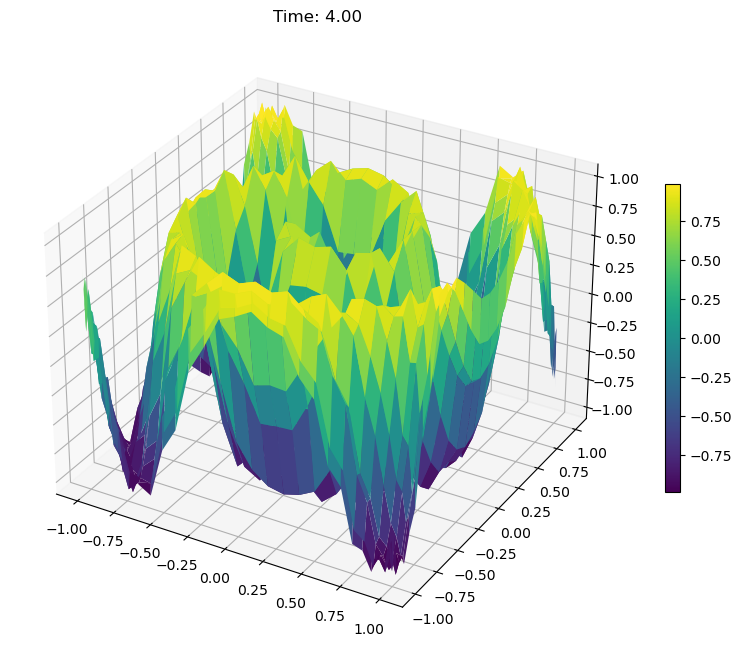

In [71]:
def get_frame(j):
    return csol.y[:(N+1)**2, j].reshape(N+1, N+1)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
fu = get_frame(0)
surf = ax.plot_surface(X_, Y_, fu, cmap='viridis', edgecolor='none')
ax.set_title(f'Time: {t_eval[0]:.2f}')
cbar = fig.colorbar(surf, ax=ax, shrink=0.5)
def update(frame):
    fu = get_frame(frame)
    ax.clear()  
    surf = ax.plot_surface(X_, Y_, fu, cmap='viridis', edgecolor='none')  
    ax.set_title(f'Time: {t_eval[frame]:.2f}')  
    return [surf]


ani = FuncAnimation(
    fig, update, frames=len(t_eval), interval=300, blit=False
)


HTML(ani.to_jshtml())

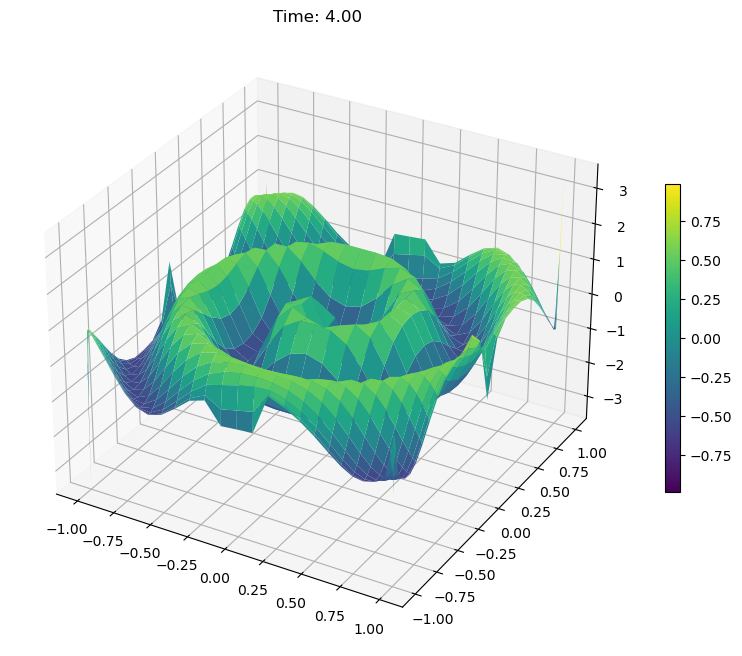

In [19]:
def get_frame(j):
    return csol.y[(N+1)**2:, j].reshape(N+1, N+1)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
fv = get_frame(0)
surf = ax.plot_surface(X_, Y_, fv, cmap='viridis', edgecolor='none')
ax.set_title(f'Time: {t_eval[0]:.2f}')
cbar = fig.colorbar(surf, ax=ax, shrink=0.5)
def update(frame):
    fv = get_frame(frame)
    ax.clear()  
    surf = ax.plot_surface(X_, Y_, fv, cmap='viridis', edgecolor='none')  
    ax.set_title(f'Time: {t_eval[frame]:.2f}')  
    return [surf]


ani = FuncAnimation(
    fig, update, frames=len(t_eval), interval=300, blit=False
)


HTML(ani.to_jshtml())